# 0.0 IMPORTS


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import numpy as np
from scipy.stats import chi2_contingency, shapiro
import warnings
from IPython.core.display           import HTML
from sklearn                   import model_selection    as ms


pd.options.display.max_columns = None

In [2]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [25, 12]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    
    sns.set()
jupyter_settings()
warnings.filterwarnings("ignore")

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## 0.1 Load data set

In [3]:
df_raw=pd.read_csv('../data/raw/application_train.csv')
# df_test=pd.read_csv('../data/raw/application_test.csv')
# bbalance=pd.read_csv('../data/raw/bureau_balance.csv')
# bureau=pd.read_csv('../data/raw/bureau.csv')
# ccbalance=pd.read_csv('../data/raw/credit_card_balance.csv')
# installments=pd.read_csv('../data/raw/installments_payments.csv')
# # Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.
# cash_balance=pd.read_csv('../data/raw/POS_CASH_balance.csv')
# previous_app=pd.read_csv('../data/raw/previous_application.csv')
# bb=pd.read_csv('')

In [5]:
df_raw.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [6]:
# df_test.head()

In [7]:
# bbalance.head()

In [8]:
# bureau.head()

In [9]:
# ccbalance.head()

In [10]:
# installments.head()

In [11]:
# cash_balance.head()

In [12]:
# previous_app.head()

#  01 - Data Description

- The objective is to use statistical metrics to identify outliers in the scope of the business.

In [13]:
df1= df_raw.copy()

In [14]:
# rename columns
# data dimensions
# data types
# check na
# desc stats
# num att
# - relevant observations
# cat att
# - countplot
# target var

### 1.1 Data Dimensions

In [15]:
# data = [df_raw, df_test, bbalance, bureau, ccbalance, installments, cash_balance, previous_app]
data = [df1]

dataframes_name = ['df_raw', 'df_test', 'bbalance', 'bureau', 'ccbalance', 'installments', 'cash_balance', 'previous_app']

for dataf, names in zip(data, dataframes_name):
    print(f"The dataframe {names} has: The number of rows of {dataf.shape[0]} and the number of columns of {dataf.shape[1]}\n")


The dataframe df_raw has: The number of rows of 307511 and the number of columns of 122



### 1.2 Data Types

In [16]:
for dataf, names in zip(data, dataframes_name):
    print(f"The dataframe {names} have this structure {dataf.info()}\n")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
The dataframe df_raw have this structure None



### 1.3 Check NA

Actions taken:

- Dropped columns with more than 50% of NaN value
- filled Na with zero for remaining columns (81)

In [17]:
for dataf, names in zip(data, dataframes_name):
    print(f"THE DATA FRAME {names} HAS THIS CONDITION OF NaN \n{dataf.isna().sum()}\n")

THE DATA FRAME df_raw HAS THIS CONDITION OF NaN 
SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE

In [18]:
def missing_values_table(df):
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        return mis_val_table_ren_columns

In [19]:
missing_values_table(df1).head(122)

,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


move to filter later

In [20]:
# calculation of total NaN value per column
na_percentage=(df_raw.isna().sum()/len(df_raw))*100

# filtering columns under 50% of NaN values
under_fifty=list(na_percentage[na_percentage <= 50].index)

# applying the filter to raw data frame and getting clean dataframe
df1=df1[under_fifty].copy()
df1.shape

(307511, 81)

In [21]:
df1=df1.fillna(0)

In [22]:
df1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.000000,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
df1.isna().sum()

SK_ID_CURR                      0
TARGET                          0
NAME_CONTRACT_TYPE              0
CODE_GENDER                     0
FLAG_OWN_CAR                    0
FLAG_OWN_REALTY                 0
CNT_CHILDREN                    0
AMT_INCOME_TOTAL                0
AMT_CREDIT                      0
AMT_ANNUITY                     0
AMT_GOODS_PRICE                 0
NAME_TYPE_SUITE                 0
NAME_INCOME_TYPE                0
NAME_EDUCATION_TYPE             0
NAME_FAMILY_STATUS              0
NAME_HOUSING_TYPE               0
REGION_POPULATION_RELATIVE      0
DAYS_BIRTH                      0
DAYS_EMPLOYED                   0
DAYS_REGISTRATION               0
DAYS_ID_PUBLISH                 0
FLAG_MOBIL                      0
FLAG_EMP_PHONE                  0
FLAG_WORK_PHONE                 0
FLAG_CONT_MOBILE                0
FLAG_PHONE                      0
FLAG_EMAIL                      0
OCCUPATION_TYPE                 0
CNT_FAM_MEMBERS                 0
REGION_RATING_

### 1.4 Descriptive Statistics




Next cycle:
- columns with avg try to imput avg based on available values
- to improve the model's perf check input from sklearn and see the option(mean, median, etc...)
- use pandas prof and sweetviz

#### 1.4.1 Numerical

In [24]:
def descriptive_statistics(df):

    """
    Shows the main values ​​for descriptive statistics in numerical variables.

    Args:
        data ([float64 and int64]): [Insert all numerical attributes in the dataset]

    Returns:
        [dataframe]: [A dataframe with mean, median, std deviation, skewness, kurtosis, min, max, range, normalty]
    """
    # Obtain only nuerical columns
    df1_num=df.select_dtypes(include=['int64', 'float64']).fillna(0)


    # Central Tendency - mean, meadina
    ct1= pd.DataFrame(df1_num.apply(np.mean)).T
    ct2= pd.DataFrame(df1_num.apply(np.median)).T

    # dispersion - std, min, max, range, skew, kurtosis
    ct3= pd.DataFrame(df1_num.apply(np.std)).T
    ct4= pd.DataFrame(df1_num.apply(min)).T
    ct5= pd.DataFrame(df1_num.apply(max)).T
    ct6= pd.DataFrame(df1_num.apply(lambda x: x.max() - x.min())).T
    ct7= pd.DataFrame(df1_num.apply(lambda x: x.skew())).T
    ct8= pd.DataFrame(df1_num.apply(lambda x: x.kurtosis())).T
    ct9 = pd.DataFrame(df1_num.apply(lambda x: 'not normal' if shapiro(x.sample(5000))[1] < 0.05 else 'normal')).T


    # concatenar
    df_statistics= pd.concat([ct4, ct5, ct6, ct1, ct2,ct3, ct7, ct8, ct9]).T
    df_statistics.columns=['min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis', 'shapiro']
    df_statistics.round(2)

    return df_statistics

In [25]:
descriptive_statistics=descriptive_statistics(df1)
descriptive_statistics.head(50)

,min,max,range,mean,median,std,skew,kurtosis,shapiro
SK_ID_CURR,100002.0,456255.0,356253.0,278180.518577,278202.0,102790.008216,-0.0012,-1.198988,not normal
TARGET,0.0,1.0,1.0,0.080729,0.0,0.272418,3.078159,7.475109,not normal
CNT_CHILDREN,0.0,19.0,19.0,0.417052,0.0,0.72212,1.974604,7.904106,not normal
AMT_INCOME_TOTAL,25650.0,117000000.0,116974350.0,168797.919297,147150.0,237122.760726,391.559654,191786.554381,not normal
AMT_CREDIT,45000.0,4050000.0,4005000.0,599025.999706,513531.0,402490.122562,1.234778,1.934041,not normal
AMT_ANNUITY,0.0,258025.5,258025.5,27107.516051,24903.0,14494.42019,1.579448,7.705753,not normal
AMT_GOODS_PRICE,0.0,4050000.0,4050000.0,537909.479651,450000.0,369633.151639,1.34689,2.427168,not normal
REGION_POPULATION_RELATIVE,0.00029,0.072508,0.072218,0.020868,0.01885,0.013831,1.488009,3.260065,not normal
DAYS_BIRTH,-25229.0,-7489.0,17740.0,-16036.995067,-15750.0,4363.981536,-0.115673,-1.049126,not normal
DAYS_EMPLOYED,-17912.0,365243.0,383155.0,63815.045904,-1213.0,141275.53681,1.664346,0.771612,not normal


In [26]:
# ,AMT_INCOME_TOTAL,Income of the client,
# AMT_CREDIT,Credit amount of the loan,
# AMT_ANNUITY,Loan annuity

In [27]:
df1['DAYS_EMPLOYED'] / 365.25

0          -1.744011
1          -3.252567
2          -0.616016
3          -8.320329
4          -8.317591
5          -4.347707
6          -8.569473
7          -1.229295
8         999.980835
9          -5.527721
10         -1.859001
11        999.980835
12         -7.438741
13         -8.290212
14         -0.555784
15         -3.167693
16         -3.605749
17         -0.522930
18        -21.366188
19         -5.579740
20        -11.734428
21         -4.522930
22        -11.789185
23        999.980835
24         -2.042437
25         -9.566051
26         -7.195072
27         -3.378508
28         -4.917180
29         -2.765229
30         -7.304586
31         -3.022587
32        -12.057495
33         -5.639973
34        -12.553046
35         -3.490760
36         -2.102669
37         -3.526352
38        999.980835
39         -4.821355
40         -3.455168
41         -1.300479
42         -9.848049
43        999.980835
44         -2.075291
45         -2.450376
46        999.980835
47        -14

move to feature eng later

In [28]:
df1['AGE']=((df1['DAYS_BIRTH'] / -365.25)).round(0)

#### 1.4.2 Categorical

In [29]:
df_cat=df_raw.select_dtypes(exclude=['int64', 'float64'])
df_cat.head(20)

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN,NaN
5,Cash loans,M,N,Y,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Other,NaN,NaN,NaN,NaN
6,Cash loans,F,Y,Y,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,Accountants,SUNDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
7,Cash loans,M,Y,Y,Unaccompanied,State servant,Higher education,Married,House / apartment,Managers,MONDAY,Other,NaN,NaN,NaN,NaN
8,Cash loans,F,N,Y,Children,Pensioner,Secondary / secondary special,Married,House / apartment,NaN,WEDNESDAY,XNA,NaN,NaN,NaN,NaN
9,Revolving loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,THURSDAY,Electricity,NaN,NaN,NaN,NaN


In [30]:
# add the target columns
df_tg=df_raw[['TARGET','SK_ID_CURR']]
aux_cat=pd.concat([df_tg,df_cat], axis=1 )
aux_cat=aux_cat.fillna('UNKNOWN')
aux_cat.head()

,TARGET,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,1,100002,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,0,100003,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,0,100004,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,UNKNOWN,UNKNOWN,UNKNOWN,UNKNOWN
3,0,100006,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,UNKNOWN,UNKNOWN,UNKNOWN,UNKNOWN
4,0,100007,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,UNKNOWN,UNKNOWN,UNKNOWN,UNKNOWN


Interpretation:

1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases


1 typically represents clients with payment difficulties or those who have experienced late payments on at least one of the first Y installments, indicating a higher risk of loan default.

0 usually represents clients who have not experienced significant payment difficulties or late payments within the specified threshold.



- Due the dataset be imbalanced, there are a lot of categories that only appear in consequence of the denial.
- Revolving loan(i.e credit card ) is a type of credit that does not have a fixed number of payments.
- **Cash Loan** is the **main case** of the company
- The female gender has a slight bad payment comparated to man (*it's important to check if it's related to maritial status and number of kids)
    - even though females are double as man
- People between secondary and higher education has more dificulties to pay
- In the plot occupation type labores, drivers and sale staff are the main problematic categories  

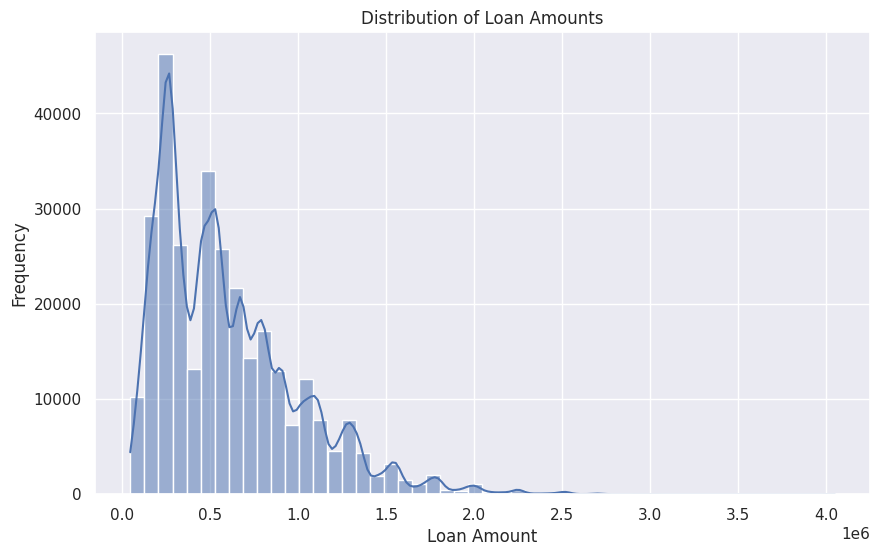

In [31]:


# Load the application_train dataset
# application_train = pd.read_csv('application_train.csv')

# Visualize distribution of loan amounts
plt.figure(figsize=(10, 6))
sns.histplot(data=df_raw, x='AMT_CREDIT', bins=50, kde=True)
plt.title('Distribution of Loan Amounts')
plt.xlabel('Loan Amount')
plt.ylabel('Frequency')
plt.show()


move to bivariate

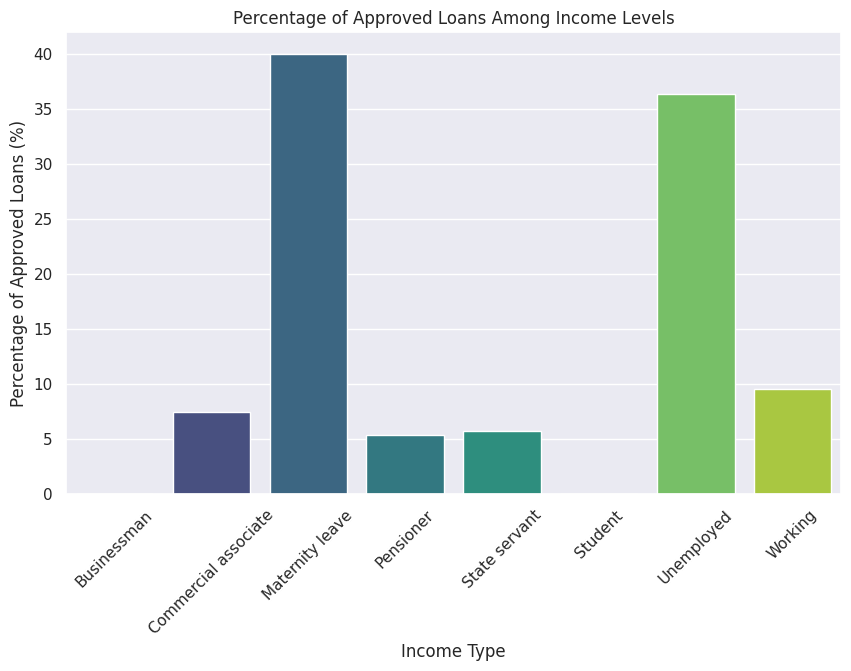

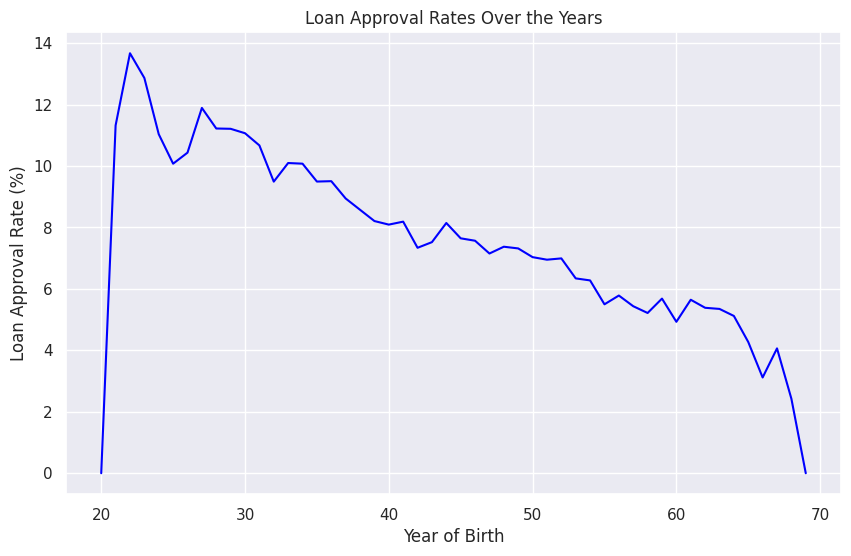

In [32]:
# Calculate the percentage of loans approved among different income levels
income_approval = df_raw.groupby('NAME_INCOME_TYPE')['TARGET'].mean() * 100

# Visualize the percentage of approved loans among income levels
plt.figure(figsize=(10, 6))
sns.barplot(x=income_approval.index, y=income_approval.values, palette='viridis')
plt.title('Percentage of Approved Loans Among Income Levels')
plt.xlabel('Income Type')
plt.ylabel('Percentage of Approved Loans (%)')
plt.xticks(rotation=45)
plt.show()

# Extract year from the 'DAYS_BIRTH' column
df_raw['YEAR_BIRTH'] = -df_raw['DAYS_BIRTH'] // 365

# Calculate loan approval rates over the years
approval_over_years = df_raw.groupby('YEAR_BIRTH')['TARGET'].mean() * 100

# Visualize trends in loan approval rates over the years
plt.figure(figsize=(10, 6))
sns.lineplot(x=approval_over_years.index, y=approval_over_years.values, color='blue')
plt.title('Loan Approval Rates Over the Years')
plt.xlabel('Year of Birth')
plt.ylabel('Loan Approval Rate (%)')
plt.show()
# In this code, replace 'application_train.csv' with the correct path to your dataset file. The code calculates the percentage of loans approved among different income levels and visualizes it using a bar plot. It also calculates and visualizes trends in loan approval rates over the years by grouping applicants based on their birth year.







#  02 - Feature Engineering:
- Derive new attributes based on the original variables to better describe the phenomenon being modeled.

In [33]:
df2=df1.copy()

In [34]:
# DAYS_EMPLOYED_DURATION fix it for year and check the min max to make sure its all good

In [35]:
# define columns to round
columns_to_round=['DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_LAST_PHONE_CHANGE']

# loop through the columns to round
for column in columns_to_round:
    new_column_name=f'{column}_DURATION'
    df2[new_column_name]= df2[column] / -365.25
    df2[new_column_name]= df2[new_column_name].apply(lambda d: math.ceil(d))

In [36]:
# df4['EMPLOYMENT_DURATION'] = df4['DAYS_EMPLOYED'] / -365.25
# df4['EMPLOYMENT_DURATION'] = df4['EMPLOYMENT_DURATION'].apply(lambda d: math.ceil(d))
# df4['REGISTRATION_DURATION'] = df4['DAYS_REGISTRATION'] / -365.25
# df4['REGISTRATION_DURATION'] = df4['DAYS_REGISTRATION'].apply(lambda d: math.ceil(d))
# df4['ID_PUBLISH_DURATION'] = df4['DAYS_ID_PUBLISH'] / -365.25
# df4['ID_PUBLISH_DURATION'] = df4['DAYS_ID_PUBLISH'].apply(lambda d: math.ceil(d))

#  03 - Data Filtering:
- Filter the rows and select columns that do not contain information for modeling or that do not match the business scope.

In [37]:
df3=df2.copy()

#  04 - Exploratory Data Analysis:
- Explore the data to find insights and better understand the impact of variables on model learning.

In [38]:
df4=df3.copy()

In [39]:
df4.dtypes

SK_ID_CURR                           int64
TARGET                               int64
NAME_CONTRACT_TYPE                  object
CODE_GENDER                         object
FLAG_OWN_CAR                        object
FLAG_OWN_REALTY                     object
CNT_CHILDREN                         int64
AMT_INCOME_TOTAL                   float64
AMT_CREDIT                         float64
AMT_ANNUITY                        float64
AMT_GOODS_PRICE                    float64
NAME_TYPE_SUITE                     object
NAME_INCOME_TYPE                    object
NAME_EDUCATION_TYPE                 object
NAME_FAMILY_STATUS                  object
NAME_HOUSING_TYPE                   object
REGION_POPULATION_RELATIVE         float64
DAYS_BIRTH                           int64
DAYS_EMPLOYED                        int64
DAYS_REGISTRATION                  float64
DAYS_ID_PUBLISH                      int64
FLAG_MOBIL                           int64
FLAG_EMP_PHONE                       int64
FLAG_WORK_P

Target variable

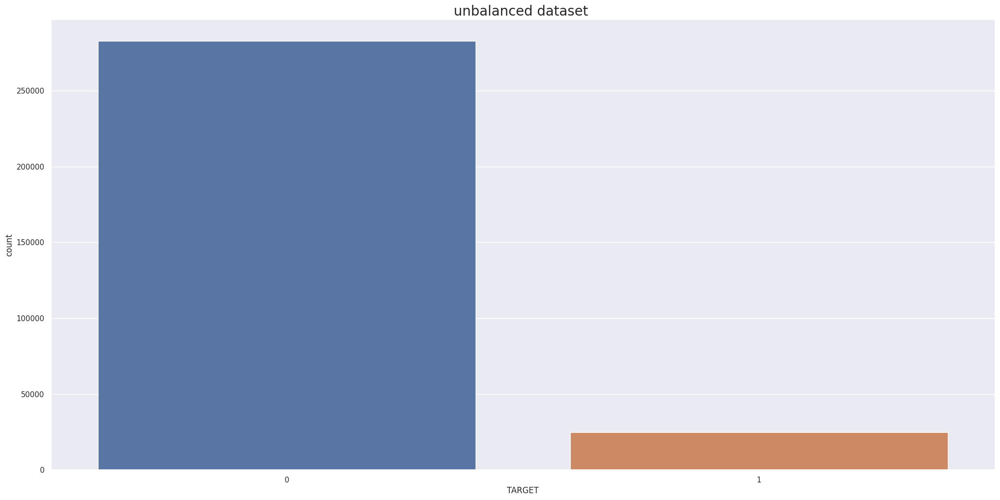

In [40]:

sns.countplot(x='TARGET', data=df1).set_title('unbalanced dataset ', fontsize=20);

- From the plot above it's possible to determine that this dataset suffers from imbalanced classes. So the models that will be used here must have ways to work around it(regularization, boosting, bagging...). 

### 4.1 Univariate Analysis

plot always distplot e boxplot with plt subplot, and make observation

In [41]:
# SELECT COUPLE COLUMNS THA MAKE MORE SENSE TO THE BUSINESS AND ANALYSE

Target

- Most people are good payers

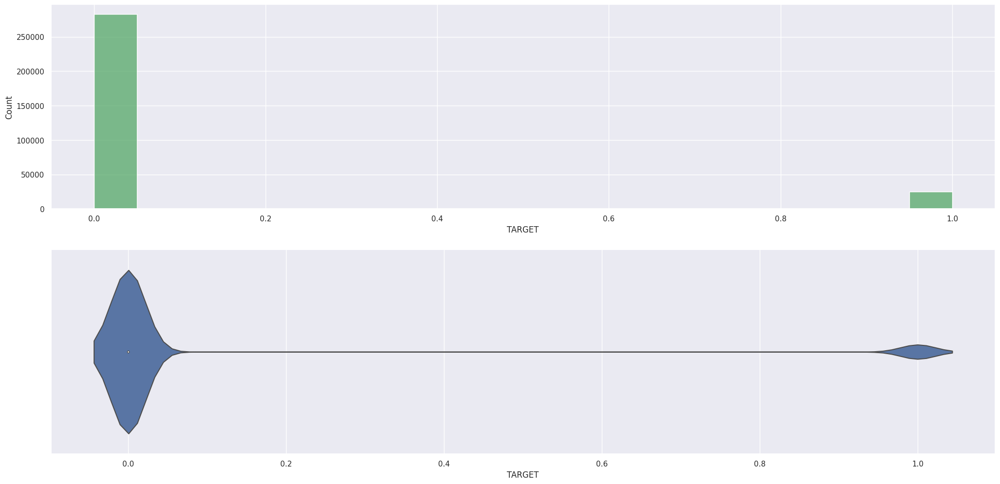

In [42]:
plt.subplot(2,1,1)
sns.histplot(x=df4.TARGET, color='g');

plt.subplot(2,1,2)
sns.violinplot(x=df4.TARGET);

CNT_CHILDREN
 - Most people has between 0 - 3 kids, which is not an impact to be a bad payers, considering that 

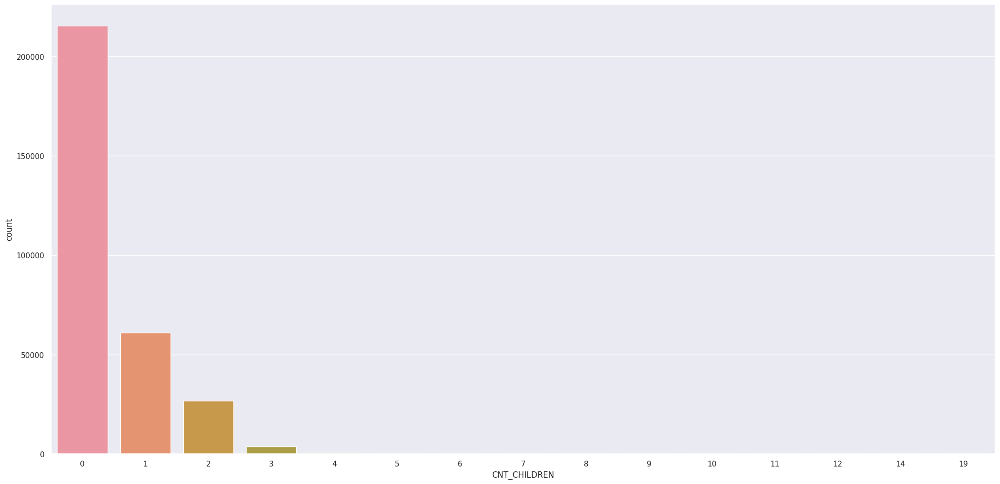

In [43]:
sns.countplot(x=df4.CNT_CHILDREN);


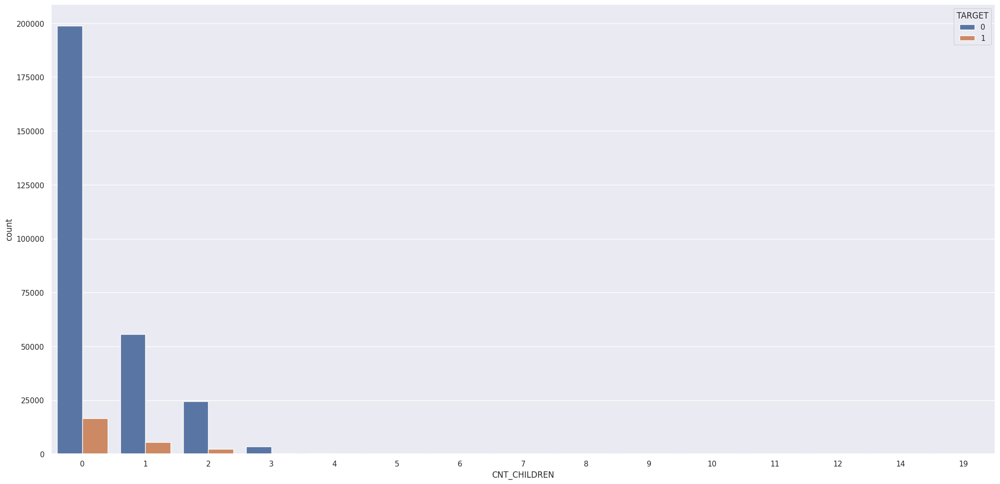

In [44]:
sns.countplot(x='CNT_CHILDREN', data=df4, hue='TARGET');

AGE
- As a person ages, they tend to be better payers
- The median of good payers is around 43 years while the bad payers tend to be younger around 

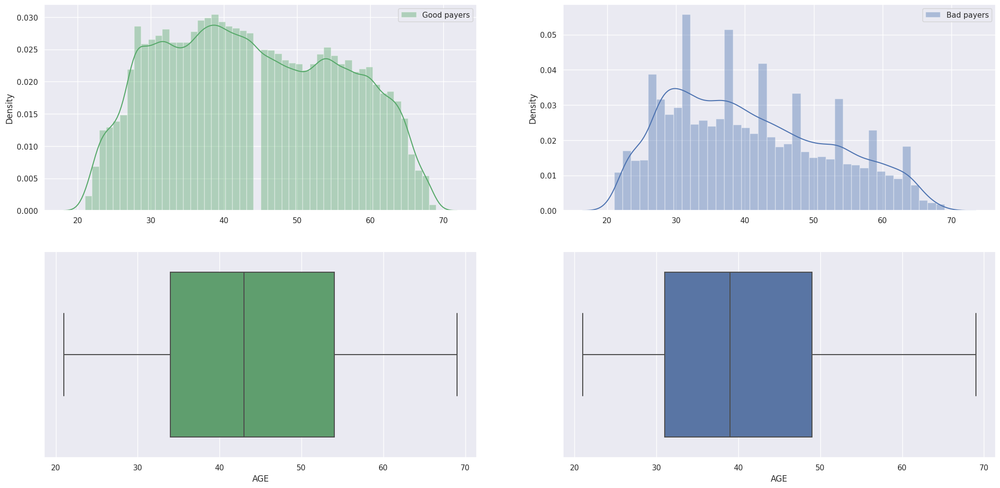

In [45]:
# create a plot 0 and 1 using boxplot 
# people with advanced age tent to have less problem with payment
sns.set_color_codes()
plt.subplot(2,2,1)
sns.distplot(x=df4.AGE, color='g', label = 'Good payers');
plt.legend();

plt.subplot(2,2,2)
sns.distplot(x=df4.loc[df4['TARGET'] == 1, 'AGE'],  label = 'Bad payers');
plt.legend();

plt.subplot(2,2,3)
sns.boxplot(x=df4.AGE, color='g');

plt.subplot(2,2,4)
sns.boxplot(x=df4.loc[df4['TARGET'] == 1, 'AGE']);

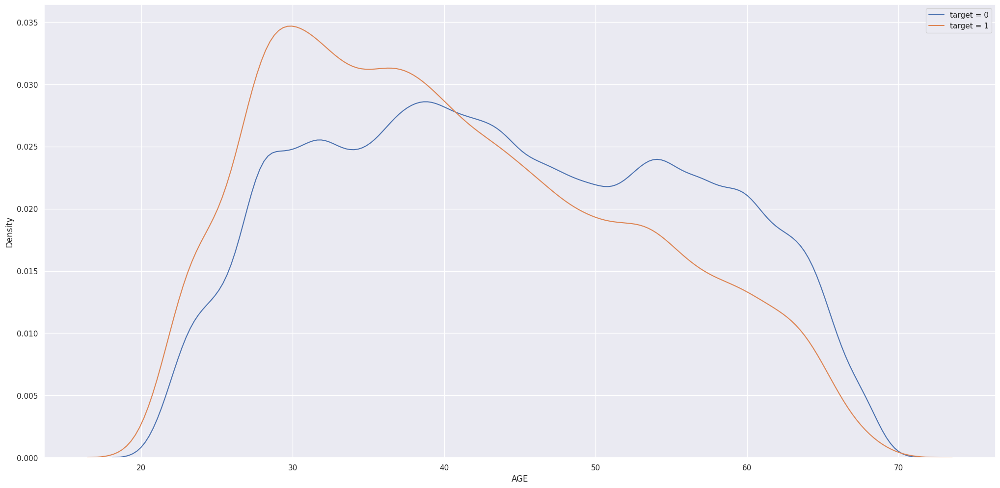

In [46]:
sns.kdeplot(df4.loc[df4['TARGET'] == 0, 'AGE'], label = 'target = 0');
sns.kdeplot(df4.loc[df4['TARGET'] == 1, 'AGE'], label = 'target = 1');
plt.legend();

AMT_REQ_CRED_BURE

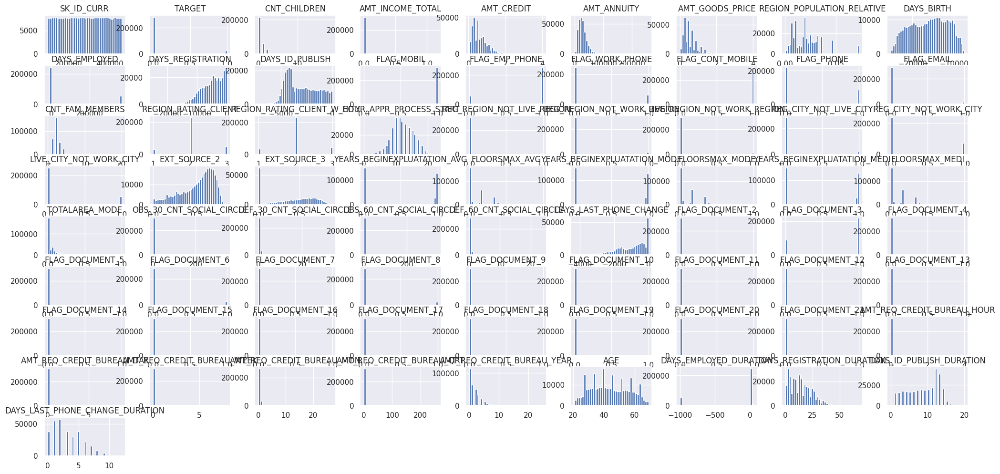

In [47]:
df4.hist(bins=40);

AMT_REQ_CREDIT_BUREAU_YEAR

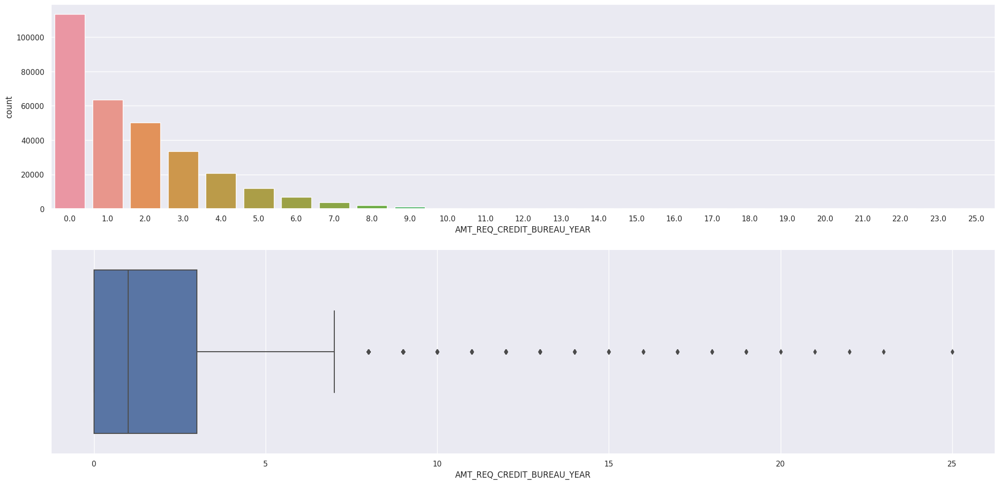

In [48]:
plt.subplot(2,1,1)
sns.countplot(x=df4.AMT_REQ_CREDIT_BUREAU_YEAR);
# sns.barplot(x=df4.AMT_REQ_CREDIT_BUREAU_YEAR);

plt.subplot(2,1,2)
sns.boxplot(x=df4.AMT_REQ_CREDIT_BUREAU_YEAR);

AMT_GOODS_PRICE

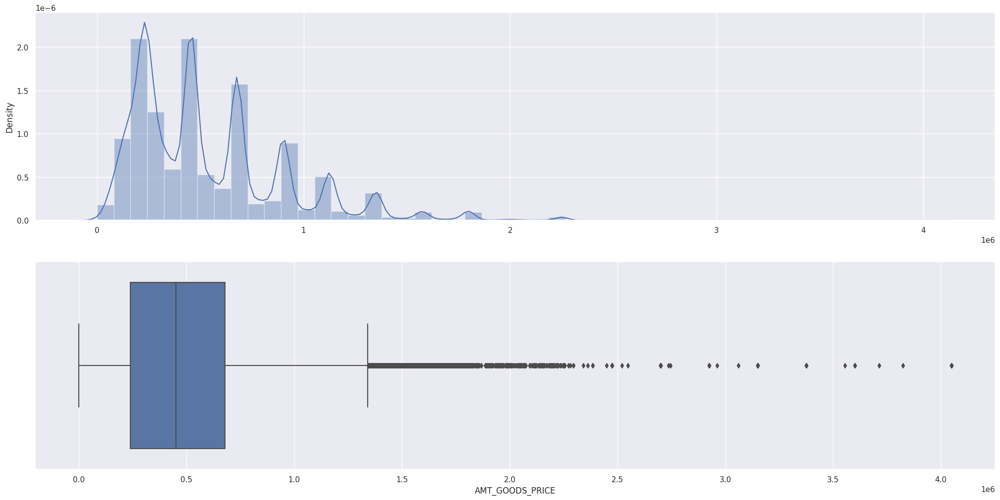

In [49]:
plt.subplot(2,1,1)
sns.distplot(x=df4.AMT_GOODS_PRICE);

plt.subplot(2,1,2)
sns.boxplot(x=df4.AMT_GOODS_PRICE);

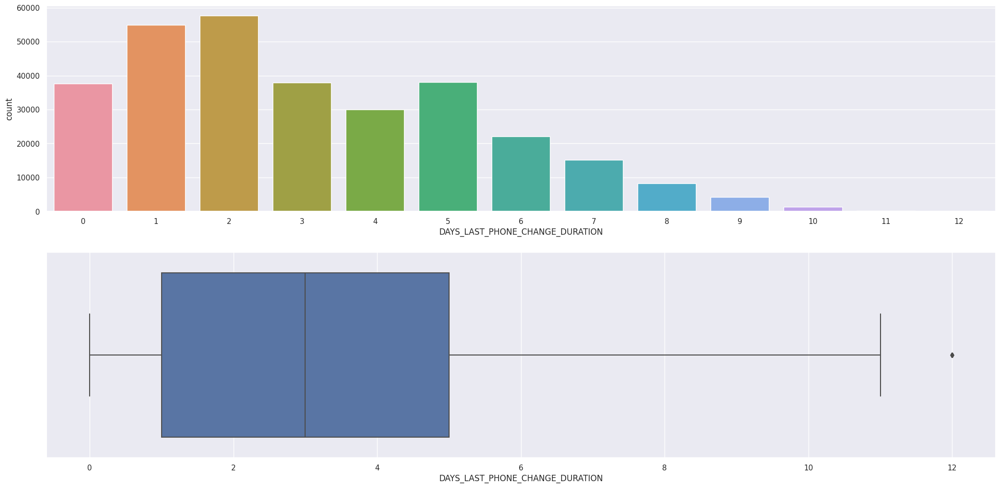

In [50]:
plt.subplot(2,1,1)
sns.countplot(x=df4.DAYS_LAST_PHONE_CHANGE_DURATION);

plt.subplot(2,1,2)
sns.boxplot(x=df4.DAYS_LAST_PHONE_CHANGE_DURATION);

AMT_INCOME_TOTAL

check if the values are outliers or not
CHECK THE VALUE MIN MAX AND ADJUST THE PLOT

In [51]:
# plt.subplot(2,1,1)
# sns.histplot(x=df4.AMT_INCOME_TOTAL);

# plt.subplot(2,1,2)
# sns.boxplot(x=df4.AMT_INCOME_TOTAL);

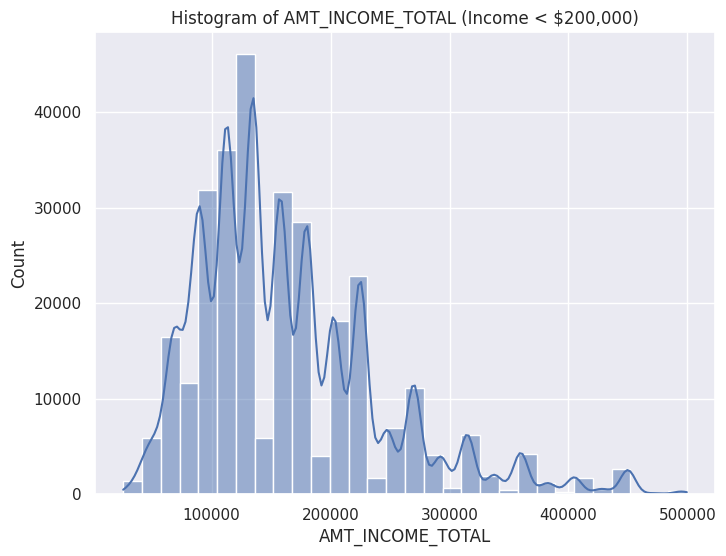

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data for 'AMT_INCOME_TOTAL' less than 200,000
filtered_data = df4[df4['AMT_INCOME_TOTAL'] < 500000]

# Create a histogram using Seaborn's histplot
plt.figure(figsize=(8, 6))
sns.histplot(data=filtered_data, x='AMT_INCOME_TOTAL', bins=30, kde=True)
plt.xlabel('AMT_INCOME_TOTAL')
plt.ylabel('Count')
plt.title('Histogram of AMT_INCOME_TOTAL (Income < $200,000)')
plt.show()


AMT_CREDIT

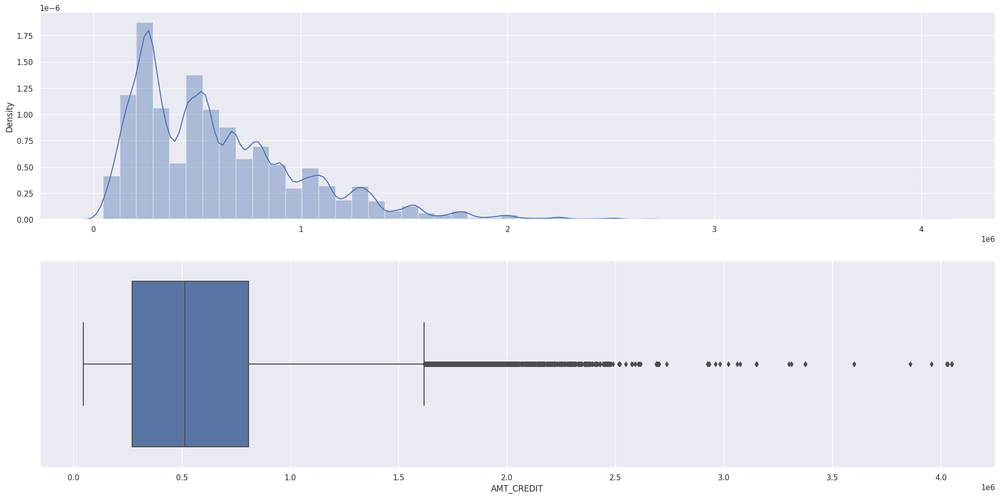

In [53]:
plt.subplot(2,1,1)
sns.distplot(x=df4.AMT_CREDIT);

plt.subplot(2,1,2)
sns.boxplot(x=df4.AMT_CREDIT);

AMT_ANNUITY

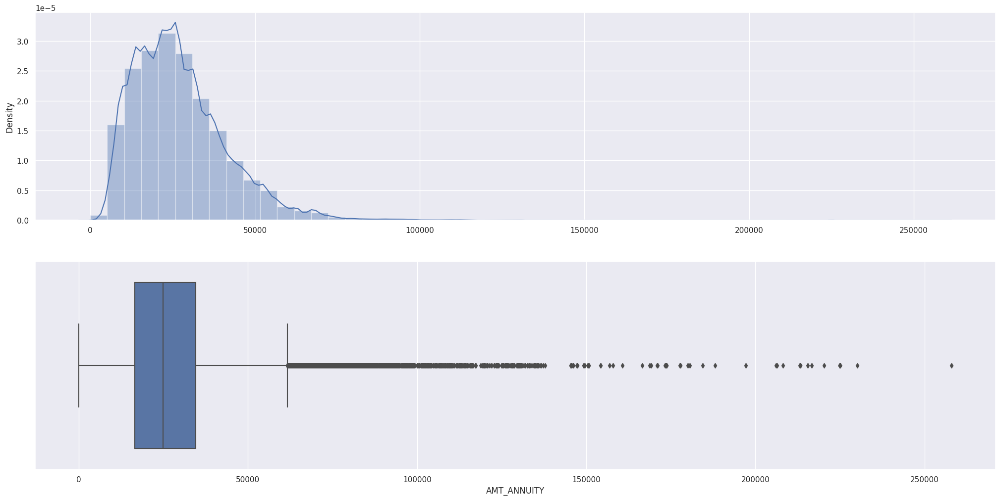

In [54]:
plt.subplot(2,1,1)
sns.distplot(x=df4.AMT_ANNUITY);

plt.subplot(2,1,2)
sns.boxplot(x=df4.AMT_ANNUITY);

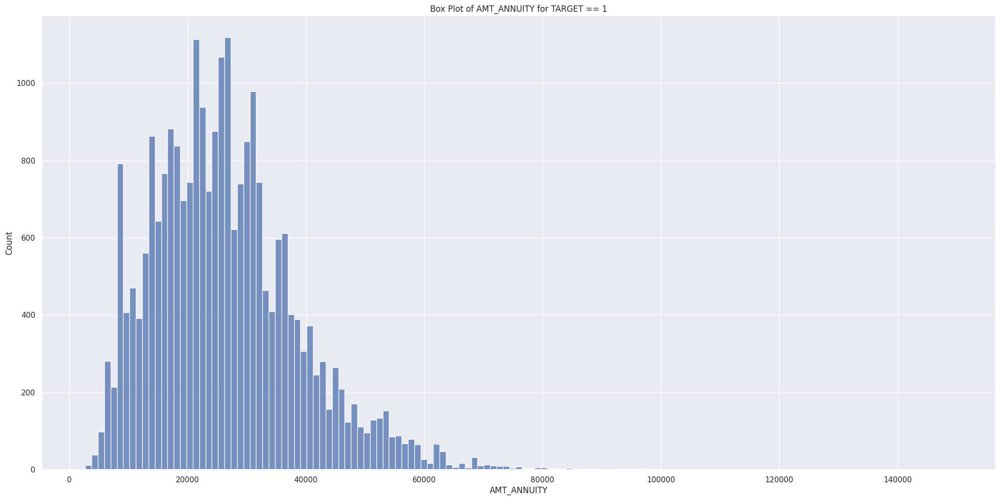

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(data=df4[df4['TARGET'] == 1], x='AMT_ANNUITY')
# sns.histplot(data=df4[df4['TARGET'] == 0], x='AMT_ANNUITY')
plt.xlabel('AMT_ANNUITY')
plt.title('Box Plot of AMT_ANNUITY for TARGET == 1')
plt.show()


In [56]:
df4.sample(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,DAYS_EMPLOYED_DURATION,DAYS_REGISTRATION_DURATION,DAYS_ID_PUBLISH_DURATION,DAYS_LAST_PHONE_CHANGE_DURATION
237064,374583,0,Cash loans,F,Y,Y,2,225000.0,1540867.5,45184.5,1345500.0,"Spouse, partner",Working,Secondary / secondary special,Married,House / apartment,0.072508,-11411,-1326,-5576.0,-3559,1,1,0,1,1,0,Laborers,4.0,1,1,MONDAY,18,0,0,0,0,0,0,Industry: type 7,0.702874,0.713631,0.9846,0.4583,0.9846,0.4583,0.9846,0.4583,0.1266,No,0.0,0.0,0.0,0.0,-1179.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,31.0,4,16,10,4
227735,363791,0,Revolving loans,M,N,Y,0,67500.0,225000.0,11250.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.003122,-21478,-1378,-3634.0,-4862,1,1,0,1,0,0,Security staff,2.0,3,3,SATURDAY,10,0,0,0,0,0,0,Other,0.433704,0.643026,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,2.0,1.0,2.0,1.0,-912.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,59.0,4,10,14,3
307350,456075,0,Cash loans,M,Y,Y,0,112500.0,717003.0,21091.5,598500.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.032561,-22732,365243,-8531.0,-4001,1,0,0,1,1,0,0,2.0,1,1,SATURDAY,12,0,0,0,0,0,0,XNA,0.761364,0.821443,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-1720.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2.0,0.0,3.0,62.0,-999,24,11,5
74808,186761,1,Cash loans,M,N,Y,0,135000.0,517500.0,16821.0,517500.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.018209,-14818,-4094,-1493.0,-4564,1,1,0,1,0,0,Laborers,2.0,3,3,THURSDAY,11,0,0,0,0,0,0,Business Entity Type 3,0.010659,0.413597,0.9866,0.1667,0.9866,0.1667,0.9866,0.1667,0.0433,No,10.0,1.0,10.0,1.0,-1328.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,3.0,41.0,12,5,13,4
305972,454505,0,Cash loans,F,Y,Y,0,121500.0,765000.0,22495.5,765000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.015221,-14035,-215,-4432.0,-4845,1,1,0,1,0,0,0,2.0,2,2,TUESDAY,11,0,0,0,0,1,1,Industry: type 3,0.719088,0.488455,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,5.0,0.0,5.0,0.0,-1730.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,38.0,1,13,14,5


add the correct tittle for each one



drop XNA

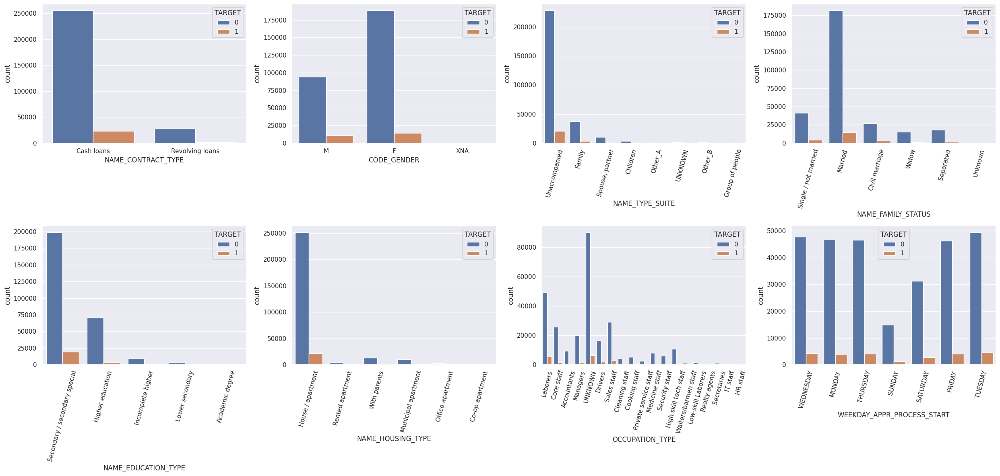

In [57]:
plt.subplot(2,4,1)
sns.countplot(x='NAME_CONTRACT_TYPE', hue='TARGET', data=aux_cat).set_title('', fontsize=20);


plt.subplot(2,4,2)
sns.countplot(x='CODE_GENDER', hue='TARGET', data=aux_cat).set_title('', fontsize=20);


plt.subplot(2,4,3)
sns.countplot(x='NAME_TYPE_SUITE', hue='TARGET', data=aux_cat).set_title('', fontsize=20);
plt.xticks(rotation=75)

plt.subplot(2,4,4)
sns.countplot(x='NAME_FAMILY_STATUS', hue='TARGET', data=aux_cat).set_title('', fontsize=20);
plt.xticks(rotation=75)

plt.subplot(2,4,5)
sns.countplot(x='NAME_EDUCATION_TYPE', hue='TARGET', data=aux_cat).set_title('', fontsize=20);
plt.xticks(rotation=75)

plt.subplot(2,4,6)
sns.countplot(x='NAME_HOUSING_TYPE', hue='TARGET', data=aux_cat).set_title('', fontsize=20);
plt.xticks(rotation=75)

plt.subplot(2,4,7)
# i liked this column
sns.countplot(x='OCCUPATION_TYPE', hue='TARGET', data=aux_cat).set_title('', fontsize=20);
plt.xticks(rotation=75)

plt.subplot(2,4,8)
sns.countplot(x='WEEKDAY_APPR_PROCESS_START', hue='TARGET', data=aux_cat).set_title('', fontsize=20);
plt.xticks(rotation=75)

# Adjust spacing between subplots
plt.tight_layout()  
plt.show()

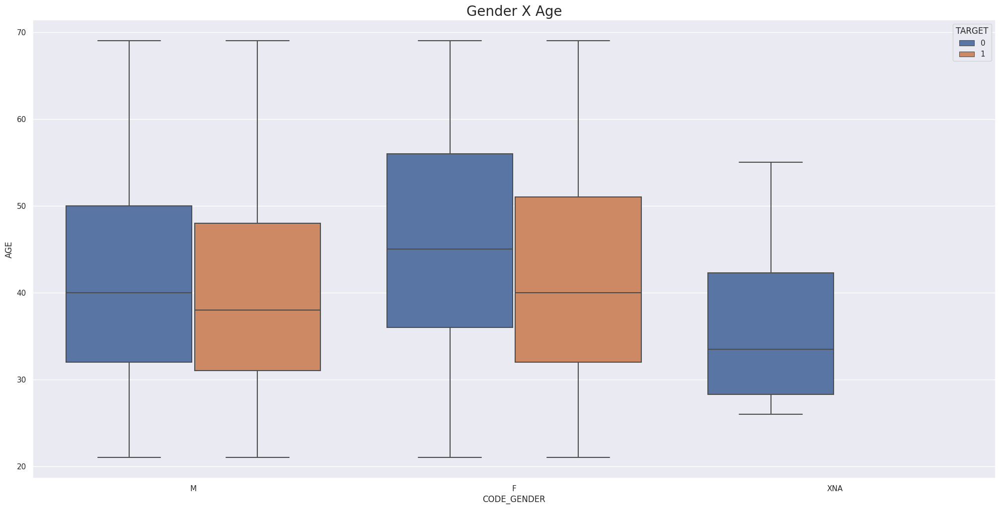

In [58]:
sns.boxplot(x='CODE_GENDER', y='AGE', hue='TARGET', data=df4).set_title('Gender X Age', fontsize=20);

### 4.2 Bivariate Analysis

- Hypotheses

- Hypothesis: Applicants with higher income are less likely to default on loans.
    - Perform a statistical test to analyze the relationship between income and loan default rates.

- Hypothesis: The age of an applicant affects their creditworthiness.
    - Examine the distribution of ages for those who defaulted and those who did not.

- Hypothesis: People with more dependents are more likely to default on loans.
    - Compare the default rates for applicants with different numbers of dependents.

- Hypothesis: Loan purpose affects the likelihood of default.
    - Analyze whether specific loan purposes have a higher default rate.

- Hypothesis: The level of education is correlated with loan repayment.
    - Investigate if higher education levels are associated with better loan repayment behavior.

- Hypothesis: Applicants with longer employment history are less likely to default.
    - Examine the relationship between the length of employment and loan default rates.

- Hypothesis: Amount of Credit is inversely related to loan default rates.
    - Analyze the credit scores of those who defaulted compared to those who did not.

- Hypothesis: Loan term length affects the likelihood of default.
    - Compare the default rates for different loan term lengths.

- Hypothesis: People with more open credit lines are less likely to default.
    - Investigate the number of open credit lines for applicants who defaulted and those who did not.

- Hypothesis: Debt-to-income ratio influences loan default.
    - Examine the relationship between the debt-to-income ratio and loan repayment behavior.3
    ###last one oct 25

- Hypothesis: Loan amount is correlated with loan default rates.
    - Analyze whether larger loan amounts are associated with a higher likelihood of default.

- Hypothesis: The region or location of the applicant affects loan repayment.
    - Explore whether loan repayment behavior differs by region or location.

- Hypothesis: Applicants with a history of previous loans are less likely to default.
    - Investigate whether having a history of successfully repaid loans impacts future default rates.

- Hypothesis: The type of employment (e.g., self-employed, government, private sector) influences loan default.
    - Compare the loan default rates among different employment types.

- Hypothesis: Marital status affects loan repayment.
    - Analyze the loan repayment behavior of married, single, and divorced individuals.

- Hypothesis: The loan approval process duration is correlated with default rates.
    - Investigate if the time it takes to approve a loan has any impact on default rates.

- Hypothesis: Loan interest rates are inversely related to default rates.
    - Examine whether higher interest rates are associated with lower default rates.

- Hypothesis: Loan collateral reduces the likelihood of default.
    - Compare default rates for loans with and without collateral.

- Hypothesis: The frequency of missed payments on previous loans is positively correlated with loan default.
    - Investigate whether applicants with a history of late payments on previous loans are more likely to default.

- Hypothesis: The loan application channel (e.g., online, in-person) affects loan repayment behavior.
    - Analyze whether the channel through which the loan application was made has an impact on default rates.


couple hypothesis to do data manipulation


1. **What is the distribution of loan amounts requested by customers?**
2. **How does the distribution of ages vary between customers who default and those who don't?**
3. **What is the average income of customers who have successfully paid off their loans?**
4. **Are younger or older customers more likely to default on their loans?**
5. **What is the relationship between education level and loan repayment behavior?**
6. **Is there a correlation between the number of children a customer has and their likelihood of defaulting?**
7. **Do customers who own real estate have a higher repayment rate compared to those who don't?**
8. **How do different income sources impact the loan repayment behavior of customers?**
9. **What is the average number of days employed for customers who have defaulted?**
10. **Is there a connection between the size of the loan and the loan repayment performance?**
11. **How do clients from different regions compare in terms of default rates?**
12. **What is the average credit score of customers who have defaulted on their loans?**
13. **Are customers with higher or lower credit scores more likely to repay their loans?**
14. **What is the average income of customers in different income types (e.g., working, commercial associate)?**
15. **How does marital status influence the likelihood of loan default?**
16. **Are there seasonal trends in loan application and default rates?**
17. **How do loan purpose categories affect the loan repayment behavior?**
18. **What is the distribution of previous application loan amounts for customers who have defaulted?**
19. **Are there differences in loan default rates between male and female borrowers?**
20. **What is the relationship between the number of past loan applications and loan default rates?**



1. **What is the percentage of loans that were approved among different income levels?**
2. **Can you identify any trends in loan approval rates over the years?**
3. **How does the loan term (number of installments) affect loan default rates?**
4. **What is the average loan amount for customers who have successfully repaid their loans early?**
5. **Are there any patterns in the relationship between family status and the likelihood of defaulting?**
6. **What are the most common occupations among customers with low credit scores?**
7. **Can you identify any differences in default rates between first-time loan applicants and repeat applicants?**
8. **Are there any clusters of customers based on their demographic and financial characteristics that exhibit similar default behavior?**
9. **How does the ratio of loan amount to the value of the asset being purchased correlate with loan default rates?**
10. **Are there customers with multiple loans at the same time, and do they have different default behaviors compared to those with a single loan?**






for the first question, it seems that women are less defaulted than men and they are more repayable than men.So as a recommandation to the bank is to improve the procedure of repayment of loans given to men.
for the second question, poeple with a low education level shows the most defaulters ,in the first place people with less than secondary school. Also people with a hight education level are less prone to default. This feature show a significative difference of the distributions of defaulter and non defaulter so it will be helpfull for the modeling task.
for the third question, widow category are the least defaulder and the civil marriage category are the most defaulter category ,and this can be explained with the high amout of expences for families so they maight face problems in paying their annuity.
for the forth question ,the most likely category that defaults is the low labores and the less category to default is accountant ,this is very logic .Another finding from this plot is that the all categories have uniform destribution in the non defaulter set .




- Hypothesis: Applicants with higher income are less likely to default on loans.
    - Perform a statistical test to analyze the relationship between income and loan default rates.
    - I decided to use a T-test to determine if there is a significant difference between income and defaulter or non defaulters
    - I adopted a p-value of 5%
    - Comparison of Means: A t-test is specifically designed to compare the means (averages) of two groups. In your case, you want to compare the mean income of two groups: applicants who defaulted and applicants who did not.

Hypothesis Testing: Hypothesis testing is a fundamental statistical technique for drawing inferences about a population based on a sample. A t-test allows you to test the null hypothesis that there is no significant difference in income between the two groups. If the p-value from the t-test is sufficiently small, you can reject the null hypothesis in favor of the alternative hypothesis, indicating a significant difference.

Assumption of Normality: The t-test assumes that the data follow a normal distribution. While the t-test is robust to moderate departures from normality, it is generally suitable when the data is approximately normally distributed. If your income data is normally distributed, a t-test can provide valid results.


- what to consider to use a t test?

In [59]:
# aux=df4[['TARGET', 'AMT_INCOME_TOTAL']]
# pd.DataFrame(aux.apply(lambda x: 'not normal' if shapiro(x.sample(5000))[1] < 0.05 else 'normal')).T

############### redo by myself
import scipy.stats as stats

# filtered_data = df4[df4['AMT_INCOME_TOTAL'] < 200000]

# Separate data into two groups: those who defaulted and those who did not
income_defaulted=df4[df4['TARGET']==1]['AMT_INCOME_TOTAL']
income_not_defaulted=df4[df4['TARGET']==0]['AMT_INCOME_TOTAL']

# Perform a two-sample t-test
t_statistic, p_value = stats.ttest_ind(income_defaulted, income_not_defaulted, equal_var=False)

# Significance level
alpha = 0.05  

# Check the p-value against the significance level
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in income.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in income.")

Fail to reject the null hypothesis: There is no significant difference in income.


- Hypothesis: The age of an applicant affects their creditworthiness.
    - Examine the distribution of ages for those who defaulted and those who did not.

Text(0.5, 1.0, 'Violin Plot of Income by Loan Default Status')

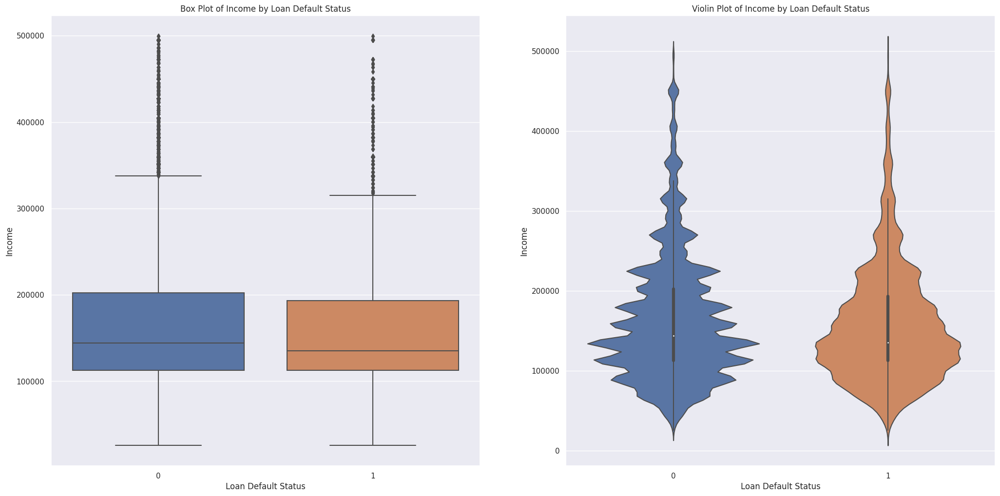

In [60]:
filtered_data = df4[df4['AMT_INCOME_TOTAL'] < 500000]


plt.subplot(1,2,1)
# Create a box plot to show the relationship
sns.boxplot(data=filtered_data, x='TARGET', y='AMT_INCOME_TOTAL');
plt.xlabel('Loan Default Status')
plt.ylabel('Income')
plt.title('Box Plot of Income by Loan Default Status')


plt.subplot(1,2,2)
# Create a violin plot to show the relationship
sns.violinplot(data=filtered_data, x='TARGET', y='AMT_INCOME_TOTAL');
plt.xlabel('Loan Default Status')
plt.ylabel('Income')
plt.title('Violin Plot of Income by Loan Default Status')



- Hypothesis: People with more dependents are more likely to default on loans.
    - Compare the default rates for applicants with different numbers of dependents.
    - to better visualize i need to cut rxtreme values

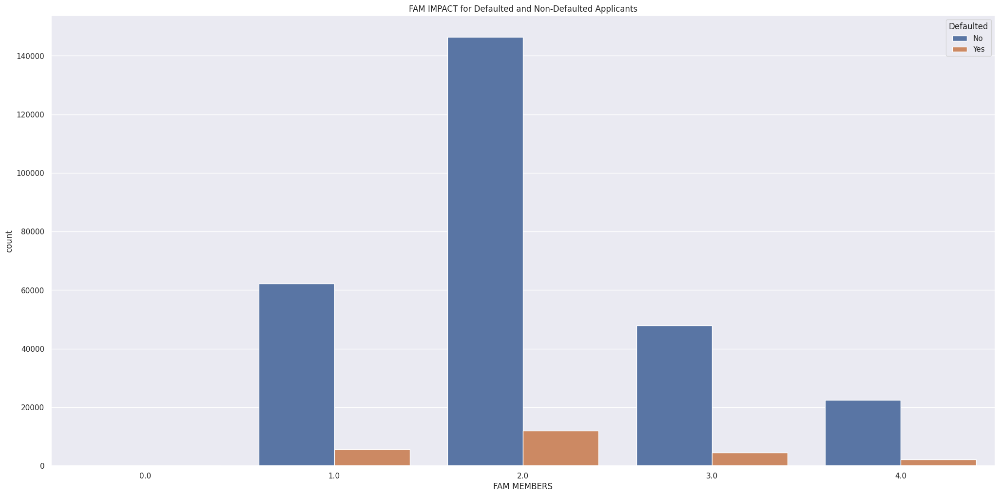

In [61]:
CNT_filtered=df4[df4['CNT_FAM_MEMBERS']<5]
sns.countplot(data=CNT_filtered, x='CNT_FAM_MEMBERS', hue='TARGET')
plt.xlabel('FAM MEMBERS')
plt.title('FAM IMPACT for Defaulted and Non-Defaulted Applicants')
plt.legend(title='Defaulted', labels=['No', 'Yes'])
plt.show()


- Hypothesis: The level of education is correlated with loan repayment.
    - Investigate if higher education levels are associated with better loan repayment behavior.
    - The chi-squared test for independence (chi-squared test) is commonly used when you want to assess whether there is an association or independence between two categorical variables.
    - A contingency table is a way to summarize and visualize the relationship between two categorical variables.

review DOF

In [62]:
from scipy.stats import chi2_contingency

# Create a contingency table of education level vs. loan repayment
contingency_table=pd.crosstab(df4['NAME_EDUCATION_TYPE'], df4['TARGET'])

# Perform the chi-squared test for independence
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

# Significance level
alpha=0.05

# Check the p-value against the significance level
if p_value < alpha:
    print('Reject the null hypothesis: There is a significant association between education level and loan repayment.')
else:
    print('Fail to reject the null hypothesis: There is no significant association between education level and loan repayment.')

Reject the null hypothesis: There is a significant association between education level and loan repayment.



- Hypothesis: Applicants with longer employment history are less likely to default.
    - Examine the relationship between the length of employment and loan default rates.

In [63]:
from scipy.stats import ttest_ind

# Separate data into two groups
# Calculate the T-test for the means of *two independent* samples of scores.
# This is a test for the null hypothesis that 2 independent samples have identical average (expected) values
def_group=df4[df4['TARGET']==1]['DAYS_EMPLOYED_DURATION']
non_def_group=df4[df4['TARGET']==0]['DAYS_EMPLOYED_DURATION']

# Perform a t-test
t_statistic, p_value = ttest_ind(def_group, non_def_group)

# Significance level
alpha = 0.05  

if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in employment duration.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in employment duration.")



Reject the null hypothesis: There is a significant difference in employment duration.


In [64]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Sample data (replace with your own dataset)
# data = {
#     'Employment_Duration_Category': ['<1 year', '1-3 years', '4-6 years', '7+ years', '<1 year', '4-6 years', '1-3 years'],
#     'Defaulted': [1, 0, 1, 0, 0, 1, 0]
# }

# df = pd.DataFrame(data)

# # Calculate the average default rate by grouping employment duration categories
# default_rates = df.groupby('Employment_Duration_Category')['Defaulted'].mean().reset_index()

# # Create a bar plot to examine the relationship between employment duration and default rates
# plt.figure(figsize=(8, 6))
# sns.barplot(data=default_rates, x='Employment_Duration_Category', y='Defaulted')
# plt.xlabel('Employment Duration Category')
# plt.ylabel('Average Default Rate')
# plt.title('Relationship Between Employment Duration and Default Rates')
# plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
# plt.show()



calculate summary statistics for employment duration separately for those who defaulted and those who did not. This will give you an idea of how the two groups differ in terms of employment duration.

In [65]:
# Separate data into two groups
mean_duration_def=df4[df4['TARGET']==1]['DAYS_EMPLOYED_DURATION'].mean().round(2)
mean_duration_non_def=df4[df4['TARGET']==0]['DAYS_EMPLOYED_DURATION'].mean().round(2)

print(
    f'The mean of years for Defaulters is: {mean_duration_def}, \nThe mean of years for NON Defaulters is: {mean_duration_non_def}')


The mean of years for Defaulters is: -115.51, 
The mean of years for NON Defaulters is: -179.27


In [66]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Sample data (replace with your own dataset)
# data = {
#     'Defaulted':           [0, 1, 1, 0, 0, 1, 0, 1, 1, 0,1,1,1,1,1,1,1,1,1,1,1],
#     'Employment_Duration': [2, 4, 5, 7, 3, 6, 1, 2, 5, 4,4,4,4,4,4,4,4,4,4,4,4]
# }

# df = pd.DataFrame(data)

# # Create a swarm plot to compare employment duration for defaulted and not defaulted applicants
# plt.figure(figsize=(8, 6))
# sns.swarmplot(data=df4, x='TARGET', y='DAYS_EMPLOYED_DURATION', palette='Set2')
# plt.xlabel('Defaulted (0 = No, 1 = Yes)')
# plt.ylabel('Employment Duration')
# plt.title('Comparison of Employment Duration for Defaulted and Not Defaulted Applicants')
# plt.show()


In [67]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Sample data (replace with your own dataset)
# data = {
#     'Defaulted':           [0, 1, 1, 0, 0, 1, 0, 1, 1, 0],
#     'Employment_Duration': [2, 4, 5, 7, 3, 6, 1, 2, 5, 4]
# }

# df = pd.DataFrame(data)
# # filter positive numbers only*******************************
# # Create a box plot to compare employment duration for defaulted and not defaulted applicants
# plt.figure(figsize=(8, 6))
# sns.boxplot(data=df4, x='TARGET', y='DAYS_EMPLOYED_DURATION')
# plt.xlabel('Defaulted (0 = No, 1 = Yes)')
# plt.ylabel('Employment Duration')
# plt.title('Comparison of Employment Duration for Defaulted and Not Defaulted Applicants')
# plt.show()


- Hypothesis: Amount of Credit is inversely related to loan default rates.
    - Analyze the credit scores of those who defaulted compared to those who did not.

In [68]:
df4.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,DAYS_EMPLOYED_DURATION,DAYS_REGISTRATION_DURATION,DAYS_ID_PUBLISH_DURATION,DAYS_LAST_PHONE_CHANGE_DURATION
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,26.0,2,10,6,4
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.000000,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,4,4,1,3
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,1,12,7,3
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,9,27,7,2
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,55.0,9,12,10,4


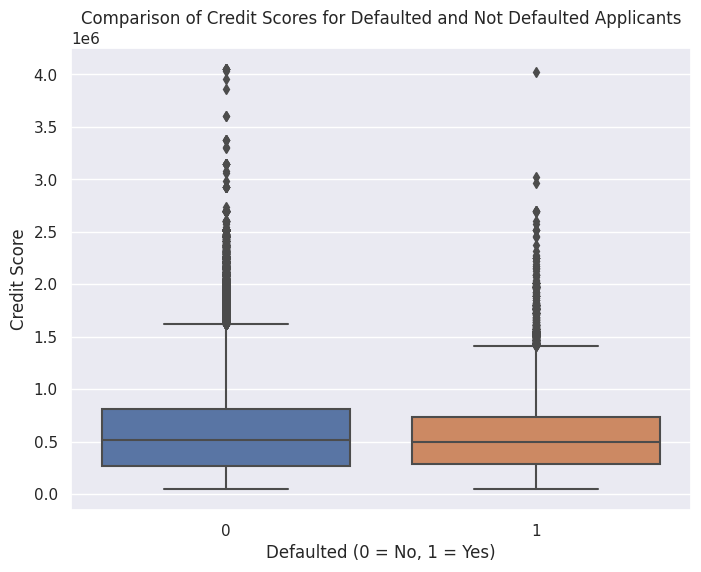

Mean Credit Score for Defaulted:  557778.527673716
Mean Credit Score for Not Defaulted:  602648.2820019386


In [69]:
# Descriptive statistics
mean_credit_score_defaulted = df4[df4['TARGET'] == 1]['AMT_CREDIT'].mean()
mean_credit_score_not_defaulted = df4[df4['TARGET'] == 0]['AMT_CREDIT'].mean()

# Create a box plot to compare credit scores for defaulted and not defaulted applicants
plt.figure(figsize=(8, 6))
sns.boxplot(data=df4, x='TARGET', y='AMT_CREDIT')
plt.xlabel('Defaulted (0 = No, 1 = Yes)')
plt.ylabel('Credit Score')
plt.title('Comparison of Credit Scores for Defaulted and Not Defaulted Applicants')
plt.show()

print("Mean Credit Score for Defaulted: ", mean_credit_score_defaulted)
print("Mean Credit Score for Not Defaulted: ", mean_credit_score_not_defaulted)


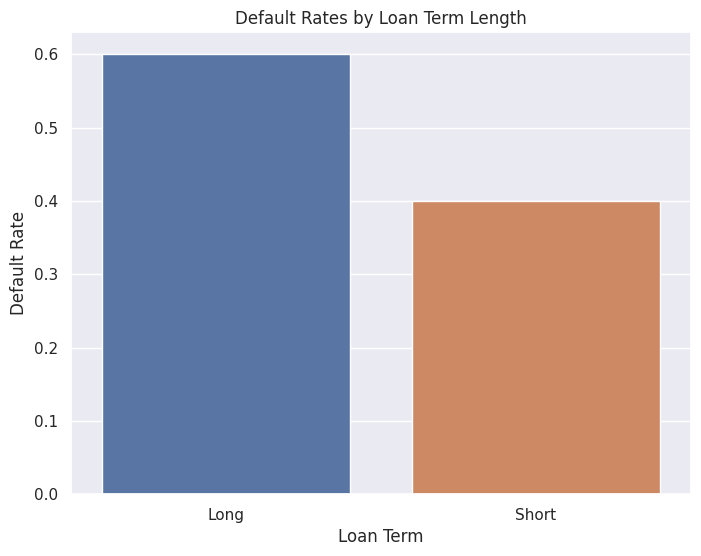

In [70]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data (replace with your own dataset)
data = {
    'Loan_Term': ['Short', 'Long', 'Short', 'Long', 'Short', 'Long', 'Short', 'Long', 'Short', 'Long'],
    'Defaulted': [0, 1, 1, 0, 0, 1, 0, 1, 1, 0]
}

df = pd.DataFrame(data)

# Calculate default rates by loan term
default_rates = df.groupby('Loan_Term')['Defaulted'].mean().reset_index()

# Create a bar plot to compare default rates
plt.figure(figsize=(8, 6))
sns.barplot(data=default_rates, x='Loan_Term', y='Defaulted')
plt.xlabel('Loan Term')
plt.ylabel('Default Rate')
plt.title('Default Rates by Loan Term Length')
plt.show()


In [71]:
df4.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,DAYS_EMPLOYED_DURATION,DAYS_REGISTRATION_DURATION,DAYS_ID_PUBLISH_DURATION,DAYS_LAST_PHONE_CHANGE_DURATION
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,26.0,2,10,6,4
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.000000,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,4,4,1,3
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,1,12,7,3
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,9,27,7,2
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,55.0,9,12,10,4


- Hypothesis: Debt-to-income ratio influences loan default.
    - Examine the relationship between the debt-to-income ratio and loan repayment behavior.
    - Taking out the outliers in the plot is possible to compare that the median value is around 0.30 ratio in either situation

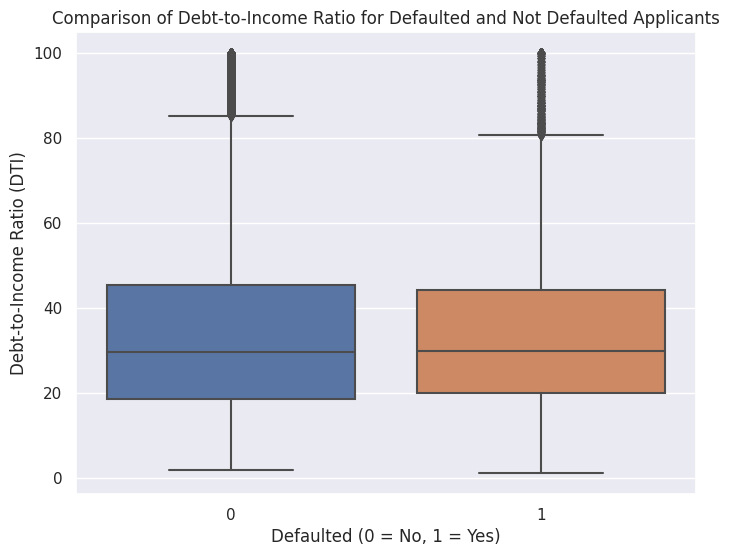

In [72]:
df4['DTI']=(df4['AMT_INCOME_TOTAL']/df4['AMT_CREDIT'])*100

# calculate stats for DTI
dti_def=df4[df4['TARGET']==1]['DTI']
dti_non_def=df4[df4['TARGET']==0]['DTI']


# boxplot to compare the distribution
plt.figure(figsize=(8,6))
sns.boxplot(x='TARGET',y='DTI',data=df4[df4['DTI'].between(0, 100)])
plt.xlabel('Defaulted (0 = No, 1 = Yes)')
plt.ylabel('Debt-to-Income Ratio (DTI)')
plt.title('Comparison of Debt-to-Income Ratio for Defaulted and Not Defaulted Applicants');


In [73]:
from scipy.stats import ttest_ind

# Perform a t-test
t_statistic, p_value = ttest_ind(dti_def, dti_non_def)

alpha = 0.05  # Significance level

if p_value < alpha:
    print("Reject the null hypothesis: DTI significantly influences loan default.")
else:
    print("Fail to reject the null hypothesis: DTI does not significantly influence loan default.")

Fail to reject the null hypothesis: DTI does not significantly influence loan default.


- Approximately 95% of the customers dont take more credit than they have as income

In [74]:
aux=df4[df4['DTI'].between(0, 100)]
Percentage = (293273 / 307511) * 100 
Percentage

95.36992172637727

- Hypothesis: Loan amount is correlated with loan default rates.
    - Analyze whether larger loan amounts are associated with a higher likelihood of default.
    - Point-Biserial Correlation: This method is specifically designed for assessing the correlation between a binary variable and a continuous variable. It calculates the correlation coefficient based on the means of the continuous variable for the two categories of the binary variable.
    - This code calculates the Point-Biserial Correlation coefficient and interprets its direction. A positive correlation suggests that those with 'TARGET' = 1 tend to have higher 'AMT_CREDIT,' while a negative correlation suggests the opposite. A correlation coefficient near 0 indicates no significant correlation.

In [75]:
from scipy.stats import ttest_ind, pearsonr, pointbiserialr

# # separate the groups
# defs=df4[df4['TARGET']==1]['AMT_CREDIT']
# non_defs=df4[df4['TARGET']==0]['AMT_CREDIT']

# # Perform a two-sample t-test
# point_biserial_corr, p_value= pointbiserialr(defs, non_defs)

# # significance level
# alpha=0.05

# if p_value < alpha:
#     print('Reject the null hypothesis: There is a significant difference between the variables')
# else:
#     print('Fail to reject the null hypothesis: There is no significant difference between the variables')


# Separate the groups
defs = df4[df4['TARGET'] == 1]['AMT_CREDIT']
non_defs = df4[df4['TARGET'] == 0]['AMT_CREDIT']

# Calculate the Point-Biserial Correlation
point_biserial_corr, _ = pointbiserialr(df4['TARGET'], df4['AMT_CREDIT'])

# Interpret the correlation coefficient
if point_biserial_corr > 0:
    print("Positive correlation: Those with 'TARGET' = 1 tend to have higher 'AMT_CREDIT'.")
elif point_biserial_corr < 0:
    print("Negative correlation: Those with 'TARGET' = 1 tend to have lower 'AMT_CREDIT'.")
else:
    print("No correlation between 'TARGET' and 'AMT_CREDIT'.")
    

Negative correlation: Those with 'TARGET' = 1 tend to have lower 'AMT_CREDIT'.


In [76]:
point_biserial_corr

-0.03036928646142976

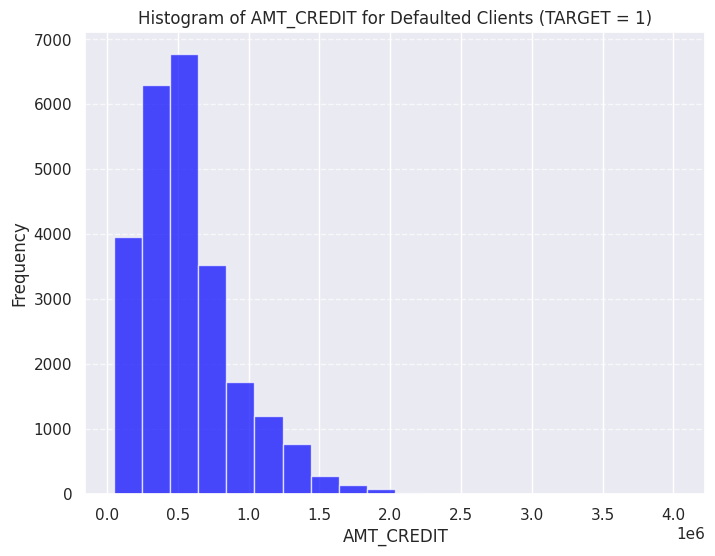

In [77]:
defaulted_clients = df4[df4['TARGET'] == 1]

# Plot a histogram for 'AMT_CREDIT'
plt.figure(figsize=(8, 6))
plt.hist(defaulted_clients['AMT_CREDIT'], bins=20, color='blue', alpha=0.7)
plt.xlabel('AMT_CREDIT')
plt.ylabel('Frequency')
plt.title('Histogram of AMT_CREDIT for Defaulted Clients (TARGET = 1)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

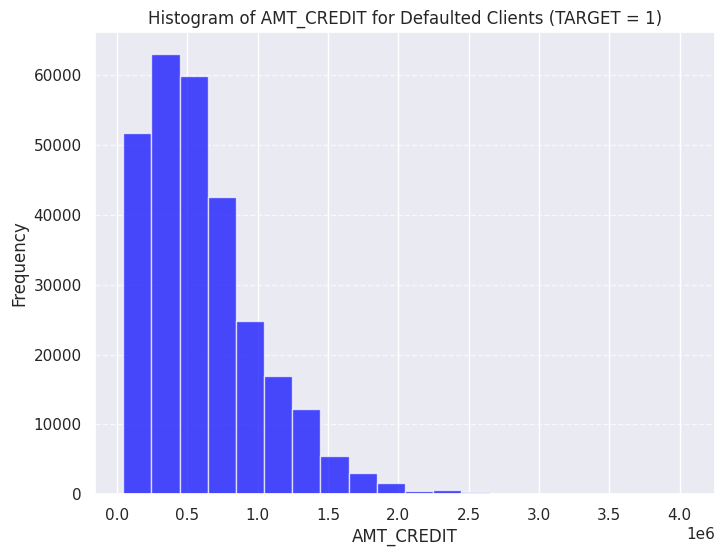

In [78]:
defaulted_clients = df4[df4['TARGET'] == 0]

# Plot a histogram for 'AMT_CREDIT'
plt.figure(figsize=(8, 6))
plt.hist(defaulted_clients['AMT_CREDIT'], bins=20, color='blue', alpha=0.7)
plt.xlabel('AMT_CREDIT')
plt.ylabel('Frequency')
plt.title('Histogram of AMT_CREDIT for Defaulted Clients (TARGET = 1)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

to test the statistical significance of the difference in 'AMT_CREDIT' between the two groups (defaulted and non-defaulted), you would typically use a t-test or another suitable statistical test

In [79]:

# separate the groups
defs=df4[df4['TARGET']==1]['AMT_CREDIT']
non_defs=df4[df4['TARGET']==0]['AMT_CREDIT']

# Perform a two-sample t-test
point_biserial_corr, p_value= ttest_ind(defs, non_defs)

# significance level
alpha=0.05

if p_value < alpha:
    print('Reject the null hypothesis: There is a significant difference between the variables')
else:
    print('Fail to reject the null hypothesis: There is no significant difference between the variables')

Reject the null hypothesis: There is a significant difference between the variables


- Hypothesis: Loan amount is correlated with loan default rates.
    - Analyze whether larger loan amounts are associated with a higher likelihood of default.

In [80]:
# from scipy.stats import pearsonr

# # separate the groups
# defs=df4[df4['TARGET']==1]['AMT_CREDIT']
# non_defs=df4[df4['TARGET']==0]['AMT_CREDIT']

# # perform correlation test using pearson
# correlation, p_value= pearsonr(defs, non_defs)
# # significance level
# alpha=0.05

# if p_value < alpha:
#     print("Reject the null hypothesis: There is a significant correlation between the variables.")
# else:
#     print("Fail to reject the null hypothesis: There is no correlation between the variables.")


from scipy.stats import ttest_ind

# separate the groups
defs=df4[df4['TARGET']==1]['AMT_CREDIT']
non_defs=df4[df4['TARGET']==0]['AMT_CREDIT']

# perform correlation test using pearson
t_statistic, p_value= ttest_ind(defs, non_defs)
# significance level
alpha=0.05

if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference between the variables.")
else:
    print("Fail to reject the null hypothesis: There is no difference between the variables.")

Reject the null hypothesis: There is a significant difference between the variables.


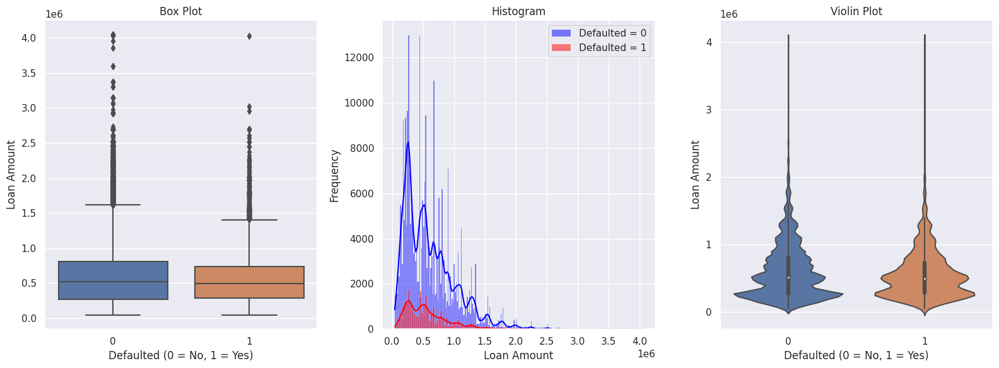

In [81]:
# plt.figure(figsize=(8, 6))
# plt.scatter(df4['AMT_CREDIT'], df4['TARGET'], alpha=0.5)
# plt.xlabel('Loan Amount')
# plt.ylabel('Defaulted (0 = No, 1 = Yes)')
# plt.title('Loan Amount vs. Loan Default Rates')
# plt.show()

# Create a grid of subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16, 6))

# Plot 1: Box Plot
sns.boxplot(data=df4, x='TARGET', y='AMT_CREDIT', ax=axes[0])
axes[0].set_xlabel('Defaulted (0 = No, 1 = Yes)')
axes[0].set_ylabel('Loan Amount')
axes[0].set_title('Box Plot')

# Plot 2: Histogram
sns.histplot(data=df4[df4['TARGET'] == 0]['AMT_CREDIT'], kde=True, ax=axes[1], color='blue', label='Defaulted = 0')
sns.histplot(data=df4[df4['TARGET'] == 1]['AMT_CREDIT'], kde=True, ax=axes[1], color='red', label='Defaulted = 1')
axes[1].set_xlabel('Loan Amount')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Histogram')
axes[1].legend()

# Plot 3: Violin Plot
sns.violinplot(data=df4, x='TARGET', y='AMT_CREDIT', ax=axes[2])
axes[2].set_xlabel('Defaulted (0 = No, 1 = Yes)')
axes[2].set_ylabel('Loan Amount')
axes[2].set_title('Violin Plot')

plt.tight_layout()
plt.show()



- Hypothesis: The type of employment (e.g., self-employed, government, private sector) influences loan default.
    - Compare the loan default rates among different employment types.

In [82]:
from scipy.stats import fisher_exact

# Create a contingency table of the two categorical variables
cont_table=pd.crosstab(df4['TARGET'], df4['OCCUPATION_TYPE'])

# Perform the chi-squared test
chi2,p_value, dof, expected = chi2_contingency(cont_table)


# Perform Fisher's exact test
# odds_ratio, p_value = fisher_exact(cont_table)

# Significance level
alpha=0.05

# Check the p-value against the significance level
if p_value < alpha:
    print('Reject the null hypothesis: There is a significant association between occupation and loan repayment.')
else:
    print('Fail to reject the null hypothesis: There is no significant association between occupation and loan repayment.')


Reject the null hypothesis: There is a significant association between occupation and loan repayment.


- Hypothesis: Marital status affects loan repayment.
    - Analyze the loan repayment behavior of married, single, and divorced individuals.

In [83]:
# create a contingency table
cont_fam=pd.crosstab(df4['TARGET'], df4['NAME_FAMILY_STATUS'])

# perform the chi-squared test
chi2,p_value, dof, expected =chi2_contingency(cont_fam)
# significance level
alpha=0.05

# check the p-value againt the significance level
if p_value < alpha:
    print('Reject the null hypothesis: There is a significant association between Maritial status and loan repayment.')
else:
    print('Fail to reject the null hypothesis: There is no significant association between Maritial status and loan repayment.')


Reject the null hypothesis: There is a significant association between Maritial status and loan repayment.


OBS: create function for the tests next cycle

## 4.3 Multivariate Analysis

### 4.3.1 Numerical Attributes

In [84]:
# ill need to adjust the columns and see a way to display only columns with at least 0.1 / -0.1 of correlation
# option to delete directly 0.8 above
# put all in a dataframe and filter

In [85]:
df4_num=df4.select_dtypes(include=['int64','float64']).fillna(0)
# filtered_df=df4_num.iloc[:, :20]
correlation=df4_num.corr(method='pearson')
df_corr=pd.DataFrame(correlation)
# sns.heatmap(correlation, cmap='Greens', annot=True);
df_corr.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,DAYS_EMPLOYED_DURATION,DAYS_REGISTRATION_DURATION,DAYS_ID_PUBLISH_DURATION,DAYS_LAST_PHONE_CHANGE_DURATION,DTI
SK_ID_CURR,1.000000,-0.002108,-0.001129,-0.001820,-0.000343,-0.000407,-0.000390,0.000849,-0.001500,0.001366,-0.000973,-0.000384,0.002804,-0.001337,-0.000415,0.002815,0.002753,0.000281,-0.002888,-0.001075,-0.001138,0.000350,-0.000283,0.001097,0.002903,-0.001885,-0.001582,0.000067,0.002521,0.000324,0.000901,0.002961,0.000932,0.002749,0.000891,0.002840,0.002026,-0.001413,-0.000085,-0.001427,0.001182,-0.000864,0.000700,-0.003411,-0.004139,-0.001097,0.002121,-0.002694,0.001809,0.001505,-0.000815,-0.002012,-0.001045,0.000896,-0.001077,0.002604,-0.000724,0.001450,0.000509,0.000167,0.001073,0.000282,-0.002517,-0.002066,0.001879,0.000328,0.000809,0.003665,0.001486,-0.001368,0.000985,0.000419,0.001139,-0.001452
TARGET,-0.002108,1.000000,0.019187,-0.003982,-0.030369,-0.012794,-0.039565,-0.037227,0.078239,-0.044932,0.041975,0.051457,0.000534,0.045982,0.028524,0.000370,-0.023806,-0.001758,0.009312,0.058899,0.060893,-0.024166,0.005576,0.006942,0.002819,0.044395,0.050994,0.032518,-0.159030,-0.119572,-0.040965,-0.049839,-0.040944,-0.049458,-0.040983,-0.049720,-0.041037,0.009447,0.032394,0.009337,0.031401,0.055217,0.005417,0.044346,-0.002672,-0.000316,-0.028602,-0.001520,-0.008040,-0.004352,-0.001414,-0.004229,-0.000756,-0.011583,-0.009464,-0.006536,-0.011615,-0.003378,-0.007952,-0.001358,0.000215,0.003709,-0.000074,0.001701,-0.001306,-0.014794,-0.005833,0.005522,-0.078264,0.044933,-0.041966,-0.051170,-0.055538,-0.001817
CNT_CHILDREN,-0.001129,0.019187,1.000000,0.012882,0.002145,0.021414,-0.002008,-0.025573,0.330938,-0.239818,0.183395,-0.028019,0.001041,0.240714,0.055630,-0.000794,-0.029906,0.022619,0.879153,0.025423,0.024781,-0.007292,-0.013319,0.008185,0.014835,0.020072,0.070650,0.069957,-0.017903,-0.009778,-0.037629,-0.032595,-0.037610,-0.032408,-0.037651,-0.032430,-0.025620,0.015662,-0.001205,0.015302,-0.001811,-0.005867,0.001786,0.056837,-0.003709,-0.016737,-0.157024,-0.001498,0.051697,-0.001997,-0.002756,-0.005318,0.000293,0.003945,-0.005459,0.003609,0.010662,0.000773,0.004031,0.000864,0.000988,-0.002450,0.000159,0.000107,-0.001083,-0.007983,-0.004913,-0.029618,-0.330799,0.239818,-0.183411,0.028094,0.004828,0.013039
AMT_INCOME_TOTAL,-0.001820,-0.003982,0.012882,1.000000,0.156870,0.191639,0.159664,0.074796,0.027261,-0.064223,0.027805,0.008506,0.000325,0.063994,-0.017193,-0.008290,0.000159,0.038378,0.016331,-0.085465,-0.091735,0.036459,0.031191,0.062340,0.058059,0.003574,0.006431,0.008285,0.061014,0.001328,0.049778,0.074953,0.049751,0.073409,0.049777,0.074662,0.060651,-0.013495,-0.013454,-0.013411,-0.013314,-0.018586,-0.001000,-0.016751,0.000529,0.001507,-0.045878,0.0038

In [86]:
## columns to be dropped CNT_CHILDREN AMT_GOODS_PRICE FLAG_EMP_PHONE REGION_RATING_CLIENT_W_CITY DEF_30_CNT_SOCIAL_CIRCLE OBS_30_CNT_SOCIAL_CIRCLE FLOORSMAX_MEDI YEARS_BEGINEXPLUATATION_MEDI	

In [87]:
df_corr[df_corr>0.8]

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,DAYS_EMPLOYED_DURATION,DAYS_REGISTRATION_DURATION,DAYS_ID_PUBLISH_DURATION,DAYS_LAST_PHONE_CHANGE_DURATION,DTI
SK_ID_CURR,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TARGET,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.879153,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMT_INCOME_TOTAL,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMT_CREDIT,NaN,NaN,NaN,NaN,1.000000,NaN,0.986687,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMT_ANNUITY,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMT_GOODS_PRICE,NaN,NaN,NaN,NaN,0.986687,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
REGION_POPULATION_RELATIVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DAYS_BIRTH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [88]:
##### add some heatmap to bivariate
# sns.heatmap( aux5.corr( method='pearson' ), annot=True )

### 4.3.2 Categorical Attributes
In order to analyse the correlation between categorical attributes I applied Cramer's V method (https://en.wikipedia.org/wiki/Cram%C3%A9r%27s_V).

#  05 - Data Preparation:
- Preparing the data so that machine learning models can learn specific behaviors.

In [89]:
df5=df4.copy()

#  06 - Feature Selection:
- Selection of the most significant attributes to train the model.

In [90]:
df6=df5.copy()

In [91]:
df6.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,DAYS_EMPLOYED_DURATION,DAYS_REGISTRATION_DURATION,DAYS_ID_PUBLISH_DURATION,DAYS_LAST_PHONE_CHANGE_DURATION,DTI
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,26.0,2,10,6,4,49.803553
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.000000,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,4,4,1,3,20.873558
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,1,12,7,3,50.000000
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,9,27,7,2,43.174786
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,55.0,9,12,10,4,23.684211


In [92]:
X=df6.drop('TARGET', axis=1)
y=df6['TARGET'].copy()

x_train, y_train, x_validation, y_validation = ms.train_test_split(X,y, test_size=0.3, stratify=y, random_state=22)





In [93]:
y.head()

0    1
1    0
2    0
3    0
4    0
Name: TARGET, dtype: int64

In [94]:
df6 = pd.concat([x_train, y_train],axis=1)
df6.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,DAYS_EMPLOYED_DURATION,DAYS_REGISTRATION_DURATION,DAYS_ID_PUBLISH_DURATION,DAYS_LAST_PHONE_CHANGE_DURATION,DTI,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,DAYS_EMPLOYED_DURATION,DAYS_REGISTRATION_DURATION,DAYS_ID_PUBLISH_DURATION,DAYS_LAST_PHONE_CHANGE_DURATION,DTI
35904,141587.0,Cash loans,M,N,Y,1.0,157500.0,776304.0,30208.5,648000.0,Unaccompanied,State servant,Secondary / secondary special,Married,House / apartment,0.030755,-16617.0,-824.0,-160.0,-161.0,1.0,1.0,0.0,1.0,0.0,0.0,Low-skill Laborers,3.0,2.0,2.0,THURSDAY,10.0,0.0,0.0,0.0,1.0,1.0,0.0,Government,0.542682,0.484851,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-553.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,45.0,3.0,1.0,1.0,2.0,20.288444,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [95]:
df4.shape

(307511, 87)

#  07 - Machine Learning Modeling:
- Machine learning model training

# 08 - Hyperparameter Fine Tunning:
- Choose the best values for each of the model parameters selected in the previous step.

#  09 - From Model to Business Understanding:
- Convert model performance into business outcome.

#  10 - Create the blueprints:
- Publish the model to a cloud environment so that other people or services can use the results to improve the business decision.